In [30]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd
from shapely.geometry import Point


In [31]:
# Set default styles for plots
sns.set(style="whitegrid")

# Load the dataset
df = pd.read_csv('HeritageTreesOfIreland.csv')

# Display the first few rows to understand the structure of the dataset
print(df.head())

# Check the shape of the dataset
print(f'The dataset contains {df.shape[0]} rows and {df.shape[1]} columns.')

# Get a summary of the dataset
df.info()


   RecordKey  SurveyKey  SampleKey   StartDate     EndDate DateType  \
0          1        NaN        NaN  15/10/2009  15/10/2009        D   
1          2        NaN        NaN  28/08/2009  28/08/2009        D   
2          3        NaN        NaN  11/09/2009  11/09/2009        D   
3          4        NaN        NaN  19/10/2009  19/10/2009        D   
4          5        NaN        NaN  29/07/2009  29/07/2009        D   

         Date   TaxonVersionKey   TaxonName GridReference  ...  \
0  15/10/2009  NHMSYS0000455513  Abies alba       M145547  ...   
1  28/08/2009  NHMSYS0000455513  Abies alba       T201853  ...   
2  11/09/2009  NHMSYS0000455513  Abies alba       H410449  ...   
3  19/10/2009  NHMSYS0000455513  Abies alba       N297678  ...   
4  29/07/2009  NHMSYS0000455513  Abies alba       N448709  ...   

   UnderValidation  ImagePath               Heritage Type  Category of Tree  \
0            False        NaN  Arboricultural curiosities   Individual tree   
1            False

In [32]:
# Drop columns with entirely missing data
df.drop(columns=['SurveyKey', 'SampleKey', 'SiteKey', 'ImagePath'], inplace=True)

# Fill missing values for categorical columns with 'Unknown'
categorical_columns = ['Heritage Type', 'Category of Tree', 'Tree form', 'Condition of tree', 'Evidence of', 'Variety']
df[categorical_columns] = df[categorical_columns].fillna('Unknown')

# Ensure no missing values remain
print(df.isnull().sum())


RecordKey            0
StartDate            2
EndDate              2
DateType             0
Date                 0
TaxonVersionKey      0
TaxonName            0
GridReference        0
East                 0
North                0
Projection           0
Precision            0
SiteName             0
Recorder             2
Determiner           2
ZeroAbundance        0
UnderValidation      0
Heritage Type        0
Category of Tree     0
Tree form            0
Condition of tree    0
Age Range            0
Evidence of          0
Access               0
Variety              0
dtype: int64


In [33]:
df['StartDate'] = pd.to_datetime(df['StartDate'], dayfirst=True, errors='coerce')
df['EndDate'] = pd.to_datetime(df['EndDate'], dayfirst=True, errors='coerce')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')


In [34]:
# Summary statistics for numeric columns
print(df.describe())

# Summary statistics for categorical columns
print(df.describe(include=['object']))


        RecordKey           East          North  Precision
count  724.000000     724.000000     724.000000      724.0
mean   366.736188  227581.562155  204487.366022      100.0
std    211.617516   67791.262297   86091.474102        0.0
min      1.000000   40486.000000   31213.000000      100.0
25%    183.750000  185172.750000  138701.500000      100.0
50%    367.500000  231271.500000  205417.500000      100.0
75%    549.250000  282989.750000  263304.750000      100.0
max    731.000000  332333.000000  442273.000000      100.0
       DateType   TaxonVersionKey      TaxonName GridReference Projection  \
count       724               724            724           724        724   
unique        2               143            143           643          1   
top           D  NBNSYS0000004638  Taxus baccata       X101781        OSI   
freq        722                90             90             6        724   

                              SiteName        Recorder      Determiner  \
count    

In [35]:
# Fill missing values in 'Evidence of' and 'Variety' with 'Unknown'
df['Evidence of'].fillna('Unknown', inplace=True)
df['Variety'].fillna('Unknown', inplace=True)

# Verify the missing data has been handled
print(df.isnull().sum())


RecordKey            0
StartDate            2
EndDate              2
DateType             0
Date                 2
TaxonVersionKey      0
TaxonName            0
GridReference        0
East                 0
North                0
Projection           0
Precision            0
SiteName             0
Recorder             2
Determiner           2
ZeroAbundance        0
UnderValidation      0
Heritage Type        0
Category of Tree     0
Tree form            0
Condition of tree    0
Age Range            0
Evidence of          0
Access               0
Variety              0
dtype: int64


In [36]:
# Convert date columns from object to datetime
df['StartDate'] = pd.to_datetime(df['StartDate'], dayfirst=True, errors='coerce')
df['EndDate'] = pd.to_datetime(df['EndDate'], dayfirst=True, errors='coerce')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')

# Verify the conversion
print(df[['StartDate', 'EndDate', 'Date']].dtypes)

StartDate    datetime64[ns]
EndDate      datetime64[ns]
Date         datetime64[ns]
dtype: object


In [37]:
# Inspect the unique values in the Access column
print(df['Access'].unique())

# If the Access column is not providing useful information, consider dropping it
# df.drop(columns=['Access'], inplace=True)

# Decide based on the output

['Please note that most heritage trees occur on private lands and permission should always be sought before entering on private property.']


In [38]:
# Convert object columns that are categorical in nature to 'category' type
categorical_columns = ['DateType', 'TaxonVersionKey', 'TaxonName', 'GridReference', 'Projection', 'SiteName',
                       'Recorder', 'Determiner', 'Heritage Type', 'Category of Tree', 'Tree form', 'Condition of tree',
                       'Age Range', 'Evidence of', 'Access', 'Variety']

df[categorical_columns] = df[categorical_columns].astype('category')

# Verify the data types have been optimized
print(df.dtypes)

RecordKey                     int64
StartDate            datetime64[ns]
EndDate              datetime64[ns]
DateType                   category
Date                 datetime64[ns]
TaxonVersionKey            category
TaxonName                  category
GridReference              category
East                          int64
North                         int64
Projection                 category
Precision                     int64
SiteName                   category
Recorder                   category
Determiner                 category
ZeroAbundance                  bool
UnderValidation                bool
Heritage Type              category
Category of Tree           category
Tree form                  category
Condition of tree          category
Age Range                  category
Evidence of                category
Access                     category
Variety                    category
dtype: object


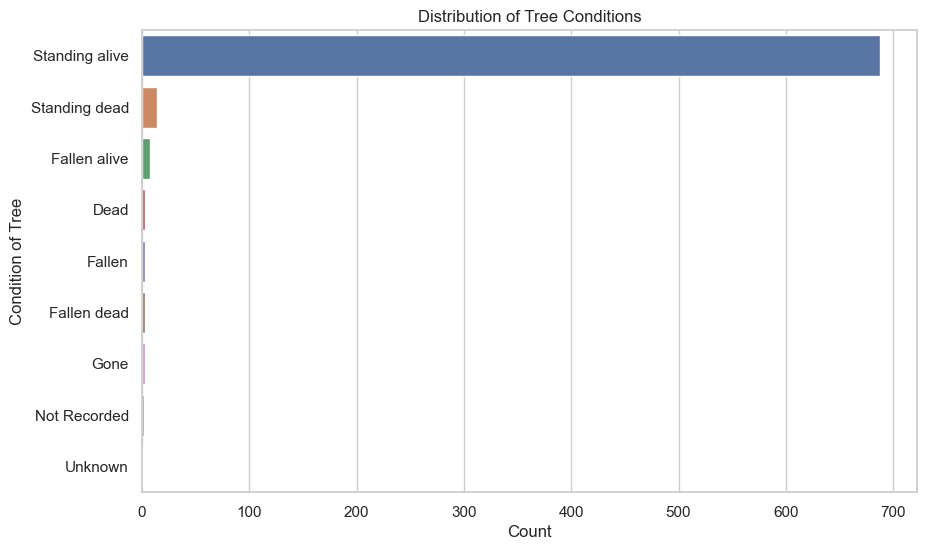

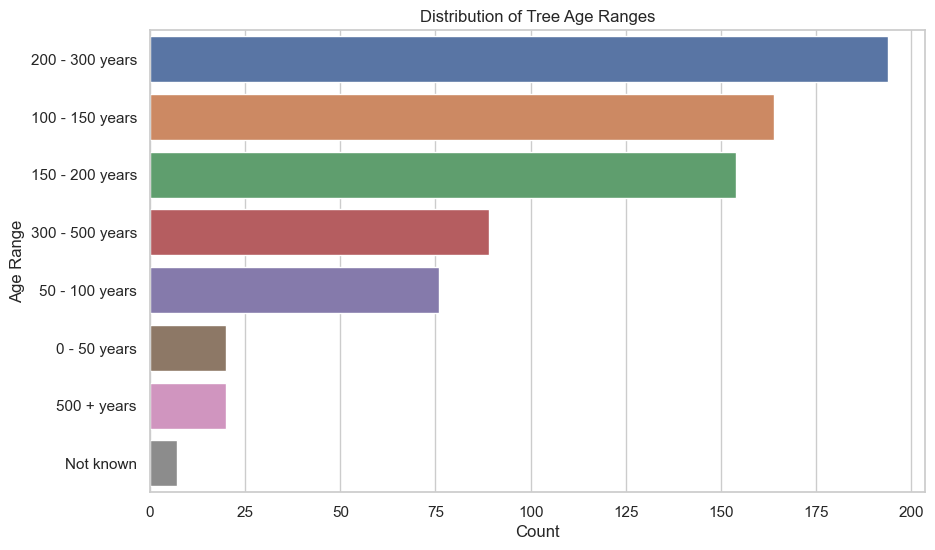

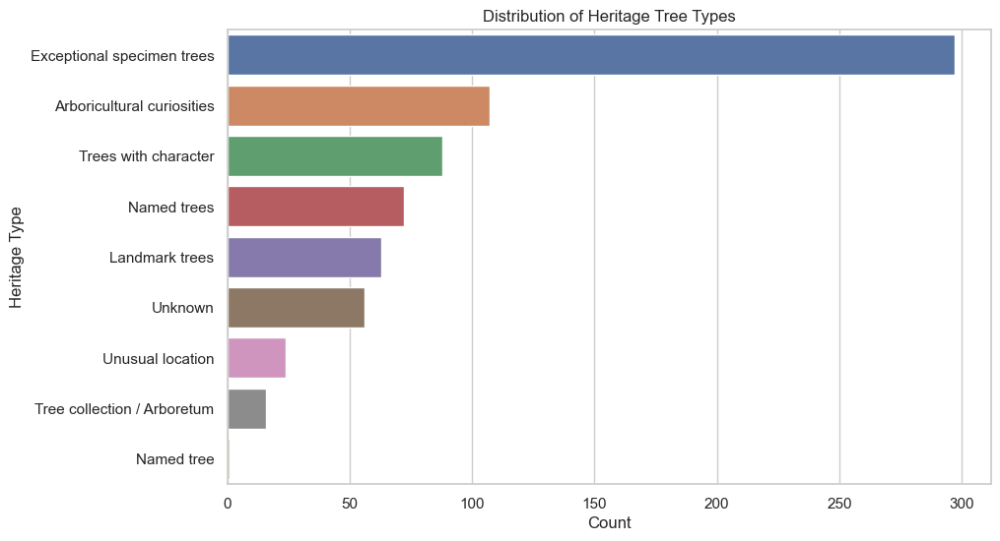

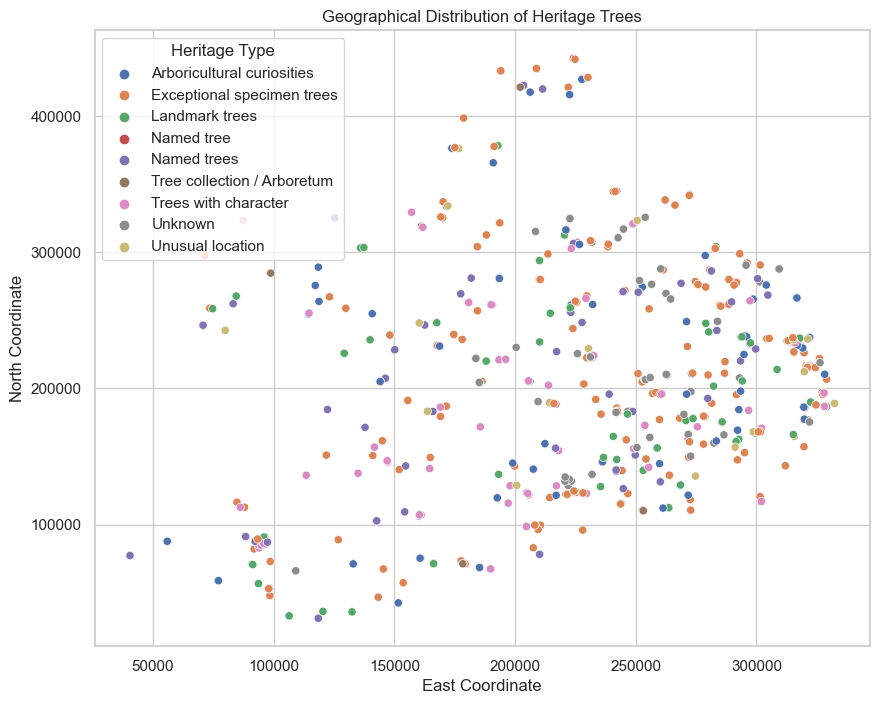

In [39]:
# Plot the distribution of tree conditions
plt.figure(figsize=(10, 6))
sns.countplot(y='Condition of tree', data=df, order=df['Condition of tree'].value_counts().index)
plt.title('Distribution of Tree Conditions')
plt.xlabel('Count')
plt.ylabel('Condition of Tree')
plt.show()

# Plot the distribution of tree age ranges
plt.figure(figsize=(10, 6))
sns.countplot(y='Age Range', data=df, order=df['Age Range'].value_counts().index)
plt.title('Distribution of Tree Age Ranges')
plt.xlabel('Count')
plt.ylabel('Age Range')
plt.show()

# Plot the distribution of heritage tree types
plt.figure(figsize=(10, 6))
sns.countplot(y='Heritage Type', data=df, order=df['Heritage Type'].value_counts().index)
plt.title('Distribution of Heritage Tree Types')
plt.xlabel('Count')
plt.ylabel('Heritage Type')
plt.show()

# Scatter plot of tree locations based on East and North coordinates
plt.figure(figsize=(10, 8))
sns.scatterplot(x='East', y='North', hue='Heritage Type', data=df)
plt.title('Geographical Distribution of Heritage Trees')
plt.xlabel('East Coordinate')
plt.ylabel('North Coordinate')
plt.show()


In [40]:
pip install pyproj folium


Note: you may need to restart the kernel to use updated packages.


In [41]:
from pyproj import Proj, transform

# Define the Irish Grid projection and WGS84 (lat/lon) projection
irish_grid = Proj(init='epsg:29902')  # Irish Grid (EPSG:29902)
wgs84 = Proj(init='epsg:4326')        # WGS84 Latitude/Longitude

# Convert Easting and Northing to Lat/Lon
df['Latitude'], df['Longitude'] = transform(irish_grid, wgs84, df['East'].values, df['North'].values)

# Check the conversion
print(df[['East', 'North', 'Latitude', 'Longitude']].head())


     East   North  Latitude  Longitude
0  114593  254709 -9.288847  53.535579
1  320107  185394 -6.215603  52.906307
2  241032  344912 -7.369721  54.351264
3  229707  267890 -7.551389  53.660105
4  244859  270980 -7.321767  53.686787


C:\Users\Luke Holmes\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

C:\Users\Luke Holmes\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

C:\Users\Luke Holmes\AppData\Local\Temp\ipykernel_4188\2147884531.py:8: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1



In [42]:
from pyproj import Transformer

# Create a transformer object for converting from Irish Grid to WGS84
transformer = Transformer.from_crs("EPSG:29903", "EPSG:4326", always_xy=True)

# Convert East and North coordinates to Latitude and Longitude
df['Longitude'], df['Latitude'] = transformer.transform(df['East'].values, df['North'].values)

# Check the conversion
print(df[['East', 'North', 'Latitude', 'Longitude']].head())



     East   North   Latitude  Longitude
0  114593  254709  53.535579  -9.288847
1  320107  185394  52.906307  -6.215603
2  241032  344912  54.351264  -7.369721
3  229707  267890  53.660105  -7.551389
4  244859  270980  53.686787  -7.321767


In [43]:
import folium

# Create a map centered roughly on Ireland
map_center = [53.1424, -7.6921]  # Latitude/Longitude of Ireland's center
m = folium.Map(location=map_center, zoom_start=7)

# Add markers for each tree
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']], 
        popup=f"Tree: {row['TaxonName']}<br>Age Range: {row['Age Range']}<br>Condition: {row['Condition of tree']}"
    ).add_to(m)

# Save the map to an HTML file
m.save('trees_map.html')

# Display the map (this will work in Jupyter notebooks)
m


In [44]:
import folium

# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add basic markers for each tree
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['TaxonName']  # Just show tree name for now
    ).add_to(m)

# Save the basic map
m.save('step1_basic_map.html')

# Display the map in a Jupyter notebook (optional)
m



In [45]:
from folium.plugins import MarkerCluster

# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add marker clustering
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the cluster
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['TaxonName']  # Keeping the basic popup for now
    ).add_to(marker_cluster)

# Save the map with marker clustering
m.save('step2_marker_clustering_map.html')

# Display the map in a Jupyter notebook (optional)
m



In [46]:
# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add marker clustering
marker_cluster = MarkerCluster().add_to(m)

# Add markers with detailed popups
for idx, row in df.iterrows():
    popup_text = f"""
    <b>Tree:</b> {row['TaxonName']}<br>
    <b>Age Range:</b> {row['Age Range']}<br>
    <b>Tree Form:</b> {row['Tree form']}<br>
    <b>Condition:</b> {row['Condition of tree']}<br>
    <b>Site Name:</b> {row['SiteName']}<br>
    <b>Heritage Type:</b> {row['Heritage Type']}
    """
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ).add_to(marker_cluster)

# Save the map with detailed popups
m.save('step3_detailed_popups_map.html')

# Display the map in a Jupyter notebook (optional)
m


In [47]:
from folium.plugins import Fullscreen, MiniMap

# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add marker clustering
marker_cluster = MarkerCluster().add_to(m)

# Add markers with detailed popups
for idx, row in df.iterrows():
    popup_text = f"""
    <b>Tree:</b> {row['TaxonName']}<br>
    <b>Age Range:</b> {row['Age Range']}<br>
    <b>Tree Form:</b> {row['Tree form']}<br>
    <b>Condition:</b> {row['Condition of tree']}<br>
    <b>Site Name:</b> {row['SiteName']}<br>
    <b>Heritage Type:</b> {row['Heritage Type']}
    """
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ).add_to(marker_cluster)

# Add extra tile layers
folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('cartodb positron').add_to(m)

# Add fullscreen button
Fullscreen().add_to(m)

# Add mini map
minimap = MiniMap()
m.add_child(minimap)

# Add layer control to toggle between tile layers
folium.LayerControl().add_to(m)

# Save the map with extra features
m.save('step4_extra_features_map.html')

# Display the map in a Jupyter notebook (optional)
m


In [48]:
from folium import FeatureGroup

# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Create a separate FeatureGroup for each tree type
tree_types = df['TaxonName'].unique()
tree_type_layers = {}

for tree_type in tree_types:
    tree_type_layers[tree_type] = FeatureGroup(name=tree_type).add_to(m)

# Add markers to the corresponding layer based on tree type
for idx, row in df.iterrows():
    popup_text = f"<b>Tree:</b> {row['TaxonName']}<br><b>Age Range:</b> {row['Age Range']}"
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ).add_to(tree_type_layers[row['TaxonName']])

# Add layer control to allow toggling between tree types
folium.LayerControl().add_to(m)

# Save the map
m.save('map_with_tree_type_filter.html')

m


In [49]:
age_ranges = df['Age Range'].unique()
age_range_layers = {}

for age_range in age_ranges:
    age_range_layers[age_range] = FeatureGroup(name=age_range).add_to(m)

# Add markers to the corresponding layer based on age range
for idx, row in df.iterrows():
    popup_text = f"<b>Tree:</b> {row['TaxonName']}<br><b>Age Range:</b> {row['Age Range']}"
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ).add_to(age_range_layers[row['Age Range']])

# Add layer control to allow toggling between age ranges
folium.LayerControl().add_to(m)

# Save the map
m.save('map_with_age_range_filter.html')
m

In [50]:
# Initialize the map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add tree type and age range filters
for tree_type in tree_types:
    for age_range in age_ranges:
        group_name = f"{tree_type} - {age_range}"
        tree_age_layer = FeatureGroup(name=group_name).add_to(m)
        
        filtered_df = df[(df['TaxonName'] == tree_type) & (df['Age Range'] == age_range)]
        for idx, row in filtered_df.iterrows():
            popup_text = f"<b>Tree:</b> {row['TaxonName']}<br><b>Age Range:</b> {row['Age Range']}"
            folium.Marker(
                location=[row['Latitude'], row['Longitude']],
                popup=popup_text
            ).add_to(tree_age_layer)

# Add layer control for combined filtering
folium.LayerControl().add_to(m)

# Save the map
m.save('map_with_tree_type_and_age_filter.html')
m

In [51]:
from folium.plugins import Search

# Create a map
m = folium.Map(location=[53.1424, -7.6921], zoom_start=7)

# Add marker clustering
marker_cluster = MarkerCluster().add_to(m)

# Add markers with detailed popups
for idx, row in df.iterrows():
    popup_text = f"<b>Tree:</b> {row['TaxonName']}<br><b>Age Range:</b> {row['Age Range']}"
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ).add_to(marker_cluster)

# Add search functionality
tree_locations = {row['TaxonName']: [row['Latitude'], row['Longitude']] for idx, row in df.iterrows()}
search = Search(layer=marker_cluster, geom_type='Point', placeholder='Search for a tree').add_to(m)

# Save the map with search functionality
m.save('map_with_search.html')
m

Dash Plot Mapping

In [52]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Assuming 'df' is your cleaned DataFrame that already contains Latitude and Longitude
# Also assuming that df contains the required columns (TaxonName, Age Range, Tree form, etc.)

# Initialize Dash app
app = dash.Dash(__name__)

# Layout for the app
app.layout = html.Div([
    html.H1("Interactive Tree Map with Detailed Info"),
    
    # Dropdown for filtering by Tree Type (TaxonName)
    html.Label("Filter by Tree Type (TaxonName):"),
    dcc.Dropdown(id='tree-type-dropdown', 
                 options=[{'label': tree, 'value': tree} for tree in df['TaxonName'].unique()], 
                 value=[], multi=True),
    
    # Dropdown for filtering by Age Range
    html.Label("Filter by Age Range:"),
    dcc.Dropdown(id='age-range-dropdown', 
                 options=[{'label': age, 'value': age} for age in df['Age Range'].unique()], 
                 value=[], multi=True),
    
    # Search input for filtering by Tree Name
    html.Label("Search for Tree by Name:"),
    dcc.Input(id='search-input', type='text', placeholder="Enter tree name...", debounce=True),
    
    # Graph to display the map
    dcc.Graph(id='tree-map')  # This will hold the interactive map
])

# Callback to update the map based on the dropdown filter values and search input
@app.callback(
    Output('tree-map', 'figure'),
    [Input('tree-type-dropdown', 'value'),
     Input('age-range-dropdown', 'value'),
     Input('search-input', 'value')]
)
def update_map(selected_tree_types, selected_age_ranges, search_value):
    # Start with the full dataframe
    filtered_df = df.copy()
    
    # Filter by TaxonName if selected
    if selected_tree_types:
        filtered_df = filtered_df[filtered_df['TaxonName'].isin(selected_tree_types)]
    
    # Filter by Age Range if selected
    if selected_age_ranges:
        filtered_df = filtered_df[filtered_df['Age Range'].isin(selected_age_ranges)]
    
    # Filter by search input if entered
    if search_value:
        filtered_df = filtered_df[filtered_df['TaxonName'].str.contains(search_value, case=False)]
    
    # Create the scatter map using Plotly
    fig = px.scatter_mapbox(
        filtered_df, lat="Latitude", lon="Longitude", color="TaxonName",
        hover_data={
            "TaxonName": True,           # Equivalent to TreeType
            "Age Range": True,           # Age range of the tree
            "Tree form": True,           # Tree form (Single, Multi-stem)
            "Condition of tree": True,   # Condition of the tree
            "SiteName": True,            # Site name where the tree is located
            "Heritage Type": True        # Heritage type of the tree
        },
        mapbox_style="carto-positron", zoom=7, height=600
    )
    
    # Return the updated figure
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


In [53]:
# Extract unique scientific names from the 'TaxonName' column and convert to a list
scientific_names = list(df['TaxonName'].unique())

# Print each scientific name in the list
for name in scientific_names:
    print(name)


Abies alba
Abies bracteata
Abies nordmanniana
Abies procera
Acacia dealbata
Acer campestre
Acer cappadocicum
Acer macrophyllum
Acer opalus
Acer platanoides
Acer pseudoplatanus
Acer rubrum
Acer saccharinum
Aesculus hippocastanum
Aesculus x carnea
Ailanthus altissima
Alnus glutinosa
Araucaria araucana
Araucaria heterophylla
Arbutus unedo
Arbutus unedo x andrachne = A. x andrachnoides
Betula pendula
Buxus sempervirens
Calocedrus decurrens
Carpinus betulus
Castanea sativa
Catalpa bignonioides
Catalpa x erubescens
Cedrus atlantica
Cedrus deodara
Cedrus libani
Cercidiphyllum japonicum
Chamaecyparis lawsoniana
Cinnamomum camphora
Clethra arborea
Cordyline australis
Corylus avellana
Crataegus monogyna
Cryptomeria japonica
Cupressus cashmeriana
Cupressus lusitanica
Cupressus macrocarpa
Cupressus sempervirens
Cyathea dealbata
Dicksonia antarctica
Eucalyptus globulus
Eucalyptus johnstonii
Eucryphia x nymansensis
Euonymus europaeus
Fagus sylvatica
Fraxinus excelsior
Ginkgo biloba
Griselinia littor

In [54]:
# Dictionary to map scientific names to common names
scientific_to_common = {
    'Abies alba': 'European Silver Fir',
    'Abies bracteata': 'Bristlecone Fir',
    'Abies nordmanniana': 'Nordmann Fir',
    'Abies procera': 'Noble Fir',
    'Acacia dealbata': 'Silver Wattle',
    'Acer campestre': 'Field Maple',
    'Acer cappadocicum': 'Cappadocian Maple',
    'Acer macrophyllum': 'Bigleaf Maple',
    'Acer opalus': 'Italian Maple',
    'Acer platanoides': 'Norway Maple',
    'Acer pseudoplatanus': 'Sycamore Maple',
    'Acer rubrum': 'Red Maple',
    'Acer saccharinum': 'Silver Maple',
    'Aesculus hippocastanum': 'Horse Chestnut',
    'Aesculus x carnea': 'Red Horse Chestnut',
    'Ailanthus altissima': 'Tree of Heaven',
    'Alnus glutinosa': 'Common Alder',
    'Araucaria araucana': 'Monkey Puzzle Tree',
    'Araucaria heterophylla': 'Norfolk Island Pine',
    'Arbutus unedo': 'Strawberry Tree',
    'Arbutus unedo x andrachne = A. x andrachnoides': 'Hybrid Strawberry Tree',
    'Betula pendula': 'Silver Birch',
    'Buxus sempervirens': 'Common Box',
    'Calocedrus decurrens': 'Incense Cedar',
    'Carpinus betulus': 'European Hornbeam',
    'Castanea sativa': 'Sweet Chestnut',
    'Catalpa bignonioides': 'Southern Catalpa',
    'Catalpa x erubescens': 'Hybrid Catalpa',
    'Cedrus atlantica': 'Atlas Cedar',
    'Cedrus deodara': 'Deodar Cedar',
    'Cedrus libani': 'Cedar of Lebanon',
    'Cercidiphyllum japonicum': 'Katsura Tree',
    'Chamaecyparis lawsoniana': 'Lawson Cypress',
    'Cinnamomum camphora': 'Camphor Tree',
    'Clethra arborea': 'Lily of the Valley Tree',
    'Cordyline australis': 'Cabbage Tree',
    'Corylus avellana': 'Common Hazel',
    'Crataegus monogyna': 'Common Hawthorn',
    'Cryptomeria japonica': 'Japanese Cedar',
    'Cupressus cashmeriana': 'Kashmir Cypress',
    'Cupressus lusitanica': 'Mexican Cypress',
    'Cupressus macrocarpa': 'Monterey Cypress',
    'Cupressus sempervirens': 'Italian Cypress',
    'Cyathea dealbata': 'Silver Fern',
    'Dicksonia antarctica': 'Tasmanian Tree Fern',
    'Eucalyptus globulus': 'Tasmanian Blue Gum',
    'Eucalyptus johnstonii': 'Johnston’s Gum',
    'Eucryphia x nymansensis': 'Nymans Eucryphia',
    'Euonymus europaeus': 'European Spindle',
    'Fagus sylvatica': 'European Beech',
    'Fraxinus excelsior': 'European Ash',
    'Ginkgo biloba': 'Ginkgo',
    'Griselinia littoralis': 'Broadleaf Griselinia',
    'Ilex aquifolium': 'Common Holly',
    'Ilex aquifolium x perado = I. x altaclerensis': 'Altaclera Holly',
    'Jubaea chilensis': 'Chilean Wine Palm',
    'Juglans ailanthifolia': 'Japanese Walnut',
    'Juglans nigra': 'Black Walnut',
    'Juglans regia': 'English Walnut',
    'Juniperus communis': 'Common Juniper',
    'Laburnum alpinum': 'Alpine Laburnum',
    'Larix decidua': 'European Larch',
    'Laureliopsis philippiana': 'Chilean Laurel',
    'Laurus nobilis': 'Bay Laurel',
    'Ligustrum lucidum': 'Glossy Privet',
    'Liquidambar styraciflua': 'Sweetgum',
    'Liriodendron tulipifera': 'Tulip Tree',
    'Luma apiculata': 'Chilean Myrtle',
    'Magnolia acuminata': 'Cucumber Tree',
    'Magnolia campbellii': 'Campbell’s Magnolia',
    'Magnolia delavayi': 'Delavay Magnolia',
    'Magnolia grandiflora': 'Southern Magnolia',
    'Magnolia sargentiana': 'Sargent’s Magnolia',
    'Malus sylvestris': 'European Crab Apple',
    'Metasequoia glyptostroboides': 'Dawn Redwood',
    'Metrosideros excelsa': 'New Zealand Christmas Tree',
    'Michelia doltsopa': 'Michelia',
    'Morus alba': 'White Mulberry',
    'Morus nigra': 'Black Mulberry',
    'Nothofagus alpina': 'Rauli Beech',
    'Nothofagus betuloides': 'Magellan’s Beech',
    'Nothofagus cunninghamii': 'Myrtle Beech',
    'Nothofagus dombeyi': 'Dombey’s Southern Beech',
    'Olea europaea': 'Olive Tree',
    'Paulownia tomentosa': 'Empress Tree',
    'Phoenix canariensis': 'Canary Island Date Palm',
    'Photinia serrulata': 'Chinese Photinia',
    'Phyllocladus trichomanoides': 'Tanekaha',
    'Picea abies': 'Norway Spruce',
    'Picea breweriana': 'Brewer’s Spruce',
    'Picea sitchensis': 'Sitka Spruce',
    'Pinus cembra': 'Swiss Pine',
    'Pinus montezumae': 'Montezuma Pine',
    'Pinus pinaster': 'Maritime Pine',
    'Pinus pinea': 'Stone Pine',
    'Pinus radiata': 'Monterey Pine',
    'Pinus sylvestris': 'Scots Pine',
    'Platanus orientalis': 'Oriental Plane',
    'Platanus occidentalis x orientalis = P. x hispanica': 'London Plane',
    'Podocarpus salignus': 'Willow-leaf Podocarp',
    'Populus nigra': 'Black Poplar',
    'Populus nigra x deltoides = P. x canadensis': 'Hybrid Black Poplar',
    'Populus alba x tremula = P. x canescens': 'Grey Poplar',
    'Populus x vernirubens': 'Hybrid Poplar',
    'Prunus avium': 'Wild Cherry',
    'Prunus laurocerasus': 'Cherry Laurel',
    'Prunus spinosa': 'Blackthorn',
    'Pseudotsuga menziesii': 'Douglas Fir',
    'Pterocarya fraxinifolia': 'Caucasian Wingnut',
    'Pyrus communis': 'Common Pear',
    'Quercus castaneifolia': 'Chestnut-leaved Oak',
    'Quercus cerris': 'Turkey Oak',
    'Quercus ilex': 'Holm Oak',
    'Quercus petraea': 'Sessile Oak',
    'Quercus robur': 'English Oak',
    'Quercus suber': 'Cork Oak',
    'Rhododendron arboreum': 'Tree Rhododendron',
    'Robinia pseudoacacia': 'Black Locust',
    'Salix alba': 'White Willow',
    'Salix alba x babylonica = S. x sepulcralis': 'Weeping Willow',
    'Sambucus nigra': 'Elder',
    'Sequoia sempervirens': 'Coast Redwood',
    'Sequoiadendron giganteum': 'Giant Sequoia',
    'Sophora japonica': 'Japanese Pagoda Tree',
    'Sorbus aria': 'Whitebeam',
    'Sorbus aucuparia': 'Rowan',
    'Sorbus devoniensis': 'Devon Whitebeam',
    'Sorbus x latifolia': 'Broad-leaved Whitebeam',
    'Sorbus aucuparia x aria = S. x thuringiaca': 'Hybrid Rowan',
    'Taxodium distichum': 'Bald Cypress',
    'Taxus baccata': 'English Yew',
    'Tetradium daniellii': 'Bee-bee Tree',
    'Thuja plicata': 'Western Red Cedar',
    'Tilia platyphyllos': 'Large-leaved Lime',
    'Tilia tomentosa': 'Silver Lime',
    'Tilia platyphyllos x cordata = T. x europaea': 'Common Lime',
    'Toona sinensis': 'Chinese Cedar',
    'Trochodendron aralioides': 'Wheel Tree',
    'Tsuga heterophylla': 'Western Hemlock',
    'Ulmus glabra': 'Wych Elm',
    'Ulmus laevis': 'European White Elm',
    'Ulmus minor': 'Field Elm',
    'Zelkova carpinifolia': 'Caucasian Zelkova',
}

In [55]:
# Dictionary to map scientific names to broader tree types
scientific_to_type = {
    'Abies alba': 'Firs',
    'Abies bracteata': 'Firs',
    'Abies nordmanniana': 'Firs',
    'Abies procera': 'Firs',
    'Acacia dealbata': 'Acacias',
    'Acer campestre': 'Maples',
    'Acer cappadocicum': 'Maples',
    'Acer macrophyllum': 'Maples',
    'Acer opalus': 'Maples',
    'Acer platanoides': 'Maples',
    'Acer pseudoplatanus': 'Maples',
    'Acer rubrum': 'Maples',
    'Acer saccharinum': 'Maples',
    'Aesculus hippocastanum': 'Horse Chestnuts',
    'Aesculus x carnea': 'Horse Chestnuts',
    'Ailanthus altissima': 'Tree of Heaven',
    'Alnus glutinosa': 'Alders',
    'Araucaria araucana': 'Monkey Puzzle',
    'Araucaria heterophylla': 'Norfolk Island Pines',
    'Arbutus unedo': 'Strawberry Trees',
    'Arbutus unedo x andrachne = A. x andrachnoides': 'Strawberry Trees',
    'Betula pendula': 'Birches',
    'Buxus sempervirens': 'Boxwoods',
    'Calocedrus decurrens': 'Incense Cedars',
    'Carpinus betulus': 'Hornbeams',
    'Castanea sativa': 'Chestnuts',
    'Catalpa bignonioides': 'Catalpas',
    'Catalpa x erubescens': 'Catalpas',
    'Cedrus atlantica': 'Cedars',
    'Cedrus deodara': 'Cedars',
    'Cedrus libani': 'Cedars',
    'Cercidiphyllum japonicum': 'Katsura Trees',
    'Chamaecyparis lawsoniana': 'False Cypresses',
    'Cinnamomum camphora': 'Camphor Trees',
    'Clethra arborea': 'Clethra',
    'Cordyline australis': 'Cabbage Trees',
    'Corylus avellana': 'Hazels',
    'Crataegus monogyna': 'Hawthorns',
    'Cryptomeria japonica': 'Japanese Cedars',
    'Cupressus cashmeriana': 'Cypresses',
    'Cupressus lusitanica': 'Cypresses',
    'Cupressus macrocarpa': 'Monterey Cypresses',
    'Cupressus sempervirens': 'Italian Cypresses',
    'Cyathea dealbata': 'Tree Ferns',
    'Dicksonia antarctica': 'Tree Ferns',
    'Eucalyptus globulus': 'Eucalypts',
    'Eucalyptus johnstonii': 'Eucalypts',
    'Eucryphia x nymansensis': 'Eucryphias',
    'Euonymus europaeus': 'Spindle Trees',
    'Fagus sylvatica': 'Beeches',
    'Fraxinus excelsior': 'Ashes',
    'Ginkgo biloba': 'Ginkgo',
    'Griselinia littoralis': 'Griselinias',
    'Ilex aquifolium': 'Hollies',
    'Ilex aquifolium x perado = I. x altaclerensis': 'Hollies',
    'Jubaea chilensis': 'Chilean Wine Palm',
    'Juglans ailanthifolia': 'Walnuts',
    'Juglans nigra': 'Walnuts',
    'Juglans regia': 'Walnuts',
    'Juniperus communis': 'Junipers',
    'Laburnum alpinum': 'Laburnums',
    'Larix decidua': 'Larches',
    'Laureliopsis philippiana': 'Laureliopsis',
    'Laurus nobilis': 'Laurels',
    'Ligustrum lucidum': 'Privets',
    'Liquidambar styraciflua': 'Sweetgums',
    'Liriodendron tulipifera': 'Tulip Trees',
    'Luma apiculata': 'Luma',
    'Magnolia acuminata': 'Magnolias',
    'Magnolia campbellii': 'Magnolias',
    'Magnolia delavayi': 'Magnolias',
    'Magnolia grandiflora': 'Magnolias',
    'Magnolia sargentiana': 'Magnolias',
    'Malus sylvestris': 'Crabapples',
    'Metasequoia glyptostroboides': 'Dawn Redwoods',
    'Metrosideros excelsa': 'Pohutukawa',
    'Michelia doltsopa': 'Michelia',
    'Morus alba': 'Mulberries',
    'Morus nigra': 'Mulberries',
    'Nothofagus alpina': 'Southern Beeches',
    'Nothofagus betuloides': 'Southern Beeches',
    'Nothofagus cunninghamii': 'Southern Beeches',
    'Nothofagus dombeyi': 'Southern Beeches',
    'Olea europaea': 'Olives',
    'Paulownia tomentosa': 'Empress Trees',
    'Phoenix canariensis': 'Canary Island Palms',
    'Photinia serrulata': 'Photinia',
    'Phyllocladus trichomanoides': 'Celery Pines',
    'Picea abies': 'Spruces',
    'Picea breweriana': 'Spruces',
    'Picea sitchensis': 'Spruces',
    'Pinus cembra': 'Pines',
    'Pinus montezumae': 'Pines',
    'Pinus pinaster': 'Pines',
    'Pinus pinea': 'Pines',
    'Pinus radiata': 'Pines',
    'Pinus sylvestris': 'Pines',
    'Platanus orientalis': 'Plane Trees',
    'Platanus occidentalis x orientalis = P. x hispanica': 'Plane Trees',
    'Podocarpus salignus': 'Podocarps',
    'Populus nigra': 'Poplars',
    'Populus nigra x deltoides = P. x canadensis': 'Poplars',
    'Populus alba x tremula = P. x canescens': 'Poplars',
    'Populus x vernirubens': 'Poplars',
    'Prunus avium': 'Cherries',
    
}


In [56]:
df['CommonName'] = df['TaxonName'].map(scientific_to_common)


In [57]:
df['CommonName'].fillna(df['TaxonName'], inplace=True)


In [64]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Assuming 'df' is your cleaned DataFrame that already contains Latitude, Longitude, TaxonName, CommonName, and BroadType

# Apply your mappings for Common Name and Broad Type
# Dictionary for scientific to common names
scientific_to_common = {
     'Abies alba': 'European Silver Fir',
    'Abies bracteata': 'Bristlecone Fir',
    'Abies nordmanniana': 'Nordmann Fir',
    'Abies procera': 'Noble Fir',
    'Acacia dealbata': 'Silver Wattle',
    'Acer campestre': 'Field Maple',
    'Acer cappadocicum': 'Cappadocian Maple',
    'Acer macrophyllum': 'Bigleaf Maple',
    'Acer opalus': 'Italian Maple',
    'Acer platanoides': 'Norway Maple',
    'Acer pseudoplatanus': 'Sycamore Maple',
    'Acer rubrum': 'Red Maple',
    'Acer saccharinum': 'Silver Maple',
    'Aesculus hippocastanum': 'Horse Chestnut',
    'Aesculus x carnea': 'Red Horse Chestnut',
    'Ailanthus altissima': 'Tree of Heaven',
    'Alnus glutinosa': 'Common Alder',
    'Araucaria araucana': 'Monkey Puzzle Tree',
    'Araucaria heterophylla': 'Norfolk Island Pine',
    'Arbutus unedo': 'Strawberry Tree',
    'Arbutus unedo x andrachne = A. x andrachnoides': 'Hybrid Strawberry Tree',
    'Betula pendula': 'Silver Birch',
    'Buxus sempervirens': 'Common Box',
    'Calocedrus decurrens': 'Incense Cedar',
    'Carpinus betulus': 'European Hornbeam',
    'Castanea sativa': 'Sweet Chestnut',
    'Catalpa bignonioides': 'Southern Catalpa',
    'Catalpa x erubescens': 'Hybrid Catalpa',
    'Cedrus atlantica': 'Atlas Cedar',
    'Cedrus deodara': 'Deodar Cedar',
    'Cedrus libani': 'Cedar of Lebanon',
    'Cercidiphyllum japonicum': 'Katsura Tree',
    'Chamaecyparis lawsoniana': 'Lawson Cypress',
    'Cinnamomum camphora': 'Camphor Tree',
    'Clethra arborea': 'Lily of the Valley Tree',
    'Cordyline australis': 'Cabbage Tree',
    'Corylus avellana': 'Common Hazel',
    'Crataegus monogyna': 'Common Hawthorn',
    'Cryptomeria japonica': 'Japanese Cedar',
    'Cupressus cashmeriana': 'Kashmir Cypress',
    'Cupressus lusitanica': 'Mexican Cypress',
    'Cupressus macrocarpa': 'Monterey Cypress',
    'Cupressus sempervirens': 'Italian Cypress',
    'Cyathea dealbata': 'Silver Fern',
    'Dicksonia antarctica': 'Tasmanian Tree Fern',
    'Eucalyptus globulus': 'Tasmanian Blue Gum',
    'Eucalyptus johnstonii': 'Johnston’s Gum',
    'Eucryphia x nymansensis': 'Nymans Eucryphia',
    'Euonymus europaeus': 'European Spindle',
    'Fagus sylvatica': 'European Beech',
    'Fraxinus excelsior': 'European Ash',
    'Ginkgo biloba': 'Ginkgo',
    'Griselinia littoralis': 'Broadleaf Griselinia',
    'Ilex aquifolium': 'Common Holly',
    'Ilex aquifolium x perado = I. x altaclerensis': 'Altaclera Holly',
    'Jubaea chilensis': 'Chilean Wine Palm',
    'Juglans ailanthifolia': 'Japanese Walnut',
    'Juglans nigra': 'Black Walnut',
    'Juglans regia': 'English Walnut',
    'Juniperus communis': 'Common Juniper',
    'Laburnum alpinum': 'Alpine Laburnum',
    'Larix decidua': 'European Larch',
    'Laureliopsis philippiana': 'Chilean Laurel',
    'Laurus nobilis': 'Bay Laurel',
    'Ligustrum lucidum': 'Glossy Privet',
    'Liquidambar styraciflua': 'Sweetgum',
    'Liriodendron tulipifera': 'Tulip Tree',
    'Luma apiculata': 'Chilean Myrtle',
    'Magnolia acuminata': 'Cucumber Tree',
    'Magnolia campbellii': 'Campbell’s Magnolia',
    'Magnolia delavayi': 'Delavay Magnolia',
    'Magnolia grandiflora': 'Southern Magnolia',
    'Magnolia sargentiana': 'Sargent’s Magnolia',
    'Malus sylvestris': 'European Crab Apple',
    'Metasequoia glyptostroboides': 'Dawn Redwood',
    'Metrosideros excelsa': 'New Zealand Christmas Tree',
    'Michelia doltsopa': 'Michelia',
    'Morus alba': 'White Mulberry',
    'Morus nigra': 'Black Mulberry',
    'Nothofagus alpina': 'Rauli Beech',
    'Nothofagus betuloides': 'Magellan’s Beech',
    'Nothofagus cunninghamii': 'Myrtle Beech',
    'Nothofagus dombeyi': 'Dombey’s Southern Beech',
    'Olea europaea': 'Olive Tree',
    'Paulownia tomentosa': 'Empress Tree',
    'Phoenix canariensis': 'Canary Island Date Palm',
    'Photinia serrulata': 'Chinese Photinia',
    'Phyllocladus trichomanoides': 'Tanekaha',
    'Picea abies': 'Norway Spruce',
    'Picea breweriana': 'Brewer’s Spruce',
    'Picea sitchensis': 'Sitka Spruce',
    'Pinus cembra': 'Swiss Pine',
    'Pinus montezumae': 'Montezuma Pine',
    'Pinus pinaster': 'Maritime Pine',
    'Pinus pinea': 'Stone Pine',
    'Pinus radiata': 'Monterey Pine',
    'Pinus sylvestris': 'Scots Pine',
    'Platanus orientalis': 'Oriental Plane',
    'Platanus occidentalis x orientalis = P. x hispanica': 'London Plane',
    'Podocarpus salignus': 'Willow-leaf Podocarp',
    'Populus nigra': 'Black Poplar',
    'Populus nigra x deltoides = P. x canadensis': 'Hybrid Black Poplar',
    'Populus alba x tremula = P. x canescens': 'Grey Poplar',
    'Populus x vernirubens': 'Hybrid Poplar',
    'Prunus avium': 'Wild Cherry',
    'Prunus laurocerasus': 'Cherry Laurel',
    'Prunus spinosa': 'Blackthorn',
    'Pseudotsuga menziesii': 'Douglas Fir',
    'Pterocarya fraxinifolia': 'Caucasian Wingnut',
    'Pyrus communis': 'Common Pear',
    'Quercus castaneifolia': 'Chestnut-leaved Oak',
    'Quercus cerris': 'Turkey Oak',
    'Quercus ilex': 'Holm Oak',
    'Quercus petraea': 'Sessile Oak',
    'Quercus robur': 'English Oak',
    'Quercus suber': 'Cork Oak',
    'Rhododendron arboreum': 'Tree Rhododendron',
    'Robinia pseudoacacia': 'Black Locust',
    'Salix alba': 'White Willow',
    'Salix alba x babylonica = S. x sepulcralis': 'Weeping Willow',
    'Sambucus nigra': 'Elder',
    'Sequoia sempervirens': 'Coast Redwood',
    'Sequoiadendron giganteum': 'Giant Sequoia',
    'Sophora japonica': 'Japanese Pagoda Tree',
    'Sorbus aria': 'Whitebeam',
    'Sorbus aucuparia': 'Rowan',
    'Sorbus devoniensis': 'Devon Whitebeam',
    'Sorbus x latifolia': 'Broad-leaved Whitebeam',
    'Sorbus aucuparia x aria = S. x thuringiaca': 'Hybrid Rowan',
    'Taxodium distichum': 'Bald Cypress',
    'Taxus baccata': 'English Yew',
    'Tetradium daniellii': 'Bee-bee Tree',
    'Thuja plicata': 'Western Red Cedar',
    'Tilia platyphyllos': 'Large-leaved Lime',
    'Tilia tomentosa': 'Silver Lime',
    'Tilia platyphyllos x cordata = T. x europaea': 'Common Lime',
    'Toona sinensis': 'Chinese Cedar',
    'Trochodendron aralioides': 'Wheel Tree',
    'Tsuga heterophylla': 'Western Hemlock',
    'Ulmus glabra': 'Wych Elm',
    'Ulmus laevis': 'European White Elm',
    'Ulmus minor': 'Field Elm',
    'Zelkova carpinifolia': 'Caucasian Zelkova',
}

# Dictionary for scientific to broad types
scientific_to_type = {
    'Abies alba': 'Firs',
    'Abies bracteata': 'Firs',
    'Abies nordmanniana': 'Firs',
    'Abies procera': 'Firs',
    'Acacia dealbata': 'Acacias',
    'Acer campestre': 'Maples',
    'Acer cappadocicum': 'Maples',
    'Acer macrophyllum': 'Maples',
    'Acer opalus': 'Maples',
    'Acer platanoides': 'Maples',
    'Acer pseudoplatanus': 'Maples',
    'Acer rubrum': 'Maples',
    'Acer saccharinum': 'Maples',
    'Aesculus hippocastanum': 'Horse Chestnuts',
    'Aesculus x carnea': 'Horse Chestnuts',
    'Ailanthus altissima': 'Tree of Heaven',
    'Alnus glutinosa': 'Alders',
    'Araucaria araucana': 'Monkey Puzzle',
    'Araucaria heterophylla': 'Norfolk Island Pines',
    'Arbutus unedo': 'Strawberry Trees',
    'Arbutus unedo x andrachne = A. x andrachnoides': 'Strawberry Trees',
    'Betula pendula': 'Birches',
    'Buxus sempervirens': 'Boxwoods',
    'Calocedrus decurrens': 'Incense Cedars',
    'Carpinus betulus': 'Hornbeams',
    'Castanea sativa': 'Chestnuts',
    'Catalpa bignonioides': 'Catalpas',
    'Catalpa x erubescens': 'Catalpas',
    'Cedrus atlantica': 'Cedars',
    'Cedrus deodara': 'Cedars',
    'Cedrus libani': 'Cedars',
    'Cercidiphyllum japonicum': 'Katsura Trees',
    'Chamaecyparis lawsoniana': 'False Cypresses',
    'Cinnamomum camphora': 'Camphor Trees',
    'Clethra arborea': 'Clethra',
    'Cordyline australis': 'Cabbage Trees',
    'Corylus avellana': 'Hazels',
    'Crataegus monogyna': 'Hawthorns',
    'Cryptomeria japonica': 'Japanese Cedars',
    'Cupressus cashmeriana': 'Cypresses',
    'Cupressus lusitanica': 'Cypresses',
    'Cupressus macrocarpa': 'Monterey Cypresses',
    'Cupressus sempervirens': 'Italian Cypresses',
    'Cyathea dealbata': 'Tree Ferns',
    'Dicksonia antarctica': 'Tree Ferns',
    'Eucalyptus globulus': 'Eucalypts',
    'Eucalyptus johnstonii': 'Eucalypts',
    'Eucryphia x nymansensis': 'Eucryphias',
    'Euonymus europaeus': 'Spindle Trees',
    'Fagus sylvatica': 'Beeches',
    'Fraxinus excelsior': 'Ashes',
    'Ginkgo biloba': 'Ginkgo',
    'Griselinia littoralis': 'Griselinias',
    'Ilex aquifolium': 'Hollies',
    'Ilex aquifolium x perado = I. x altaclerensis': 'Hollies',
    'Jubaea chilensis': 'Chilean Wine Palm',
    'Juglans ailanthifolia': 'Walnuts',
    'Juglans nigra': 'Walnuts',
    'Juglans regia': 'Walnuts',
    'Juniperus communis': 'Junipers',
    'Laburnum alpinum': 'Laburnums',
    'Larix decidua': 'Larches',
    'Laureliopsis philippiana': 'Laureliopsis',
    'Laurus nobilis': 'Laurels',
    'Ligustrum lucidum': 'Privets',
    'Liquidambar styraciflua': 'Sweetgums',
    'Liriodendron tulipifera': 'Tulip Trees',
    'Luma apiculata': 'Luma',
    'Magnolia acuminata': 'Magnolias',
    'Magnolia campbellii': 'Magnolias',
    'Magnolia delavayi': 'Magnolias',
    'Magnolia grandiflora': 'Magnolias',
    'Magnolia sargentiana': 'Magnolias',
    'Malus sylvestris': 'Crabapples',
    'Metasequoia glyptostroboides': 'Dawn Redwoods',
    'Metrosideros excelsa': 'Pohutukawa',
    'Michelia doltsopa': 'Michelia',
    'Morus alba': 'Mulberries',
    'Morus nigra': 'Mulberries',
    'Nothofagus alpina': 'Southern Beeches',
    'Nothofagus betuloides': 'Southern Beeches',
    'Nothofagus cunninghamii': 'Southern Beeches',
    'Nothofagus dombeyi': 'Southern Beeches',
    'Olea europaea': 'Olives',
    'Paulownia tomentosa': 'Empress Trees',
    'Phoenix canariensis': 'Canary Island Palms',
    'Photinia serrulata': 'Photinia',
    'Phyllocladus trichomanoides': 'Celery Pines',
    'Picea abies': 'Spruces',
    'Picea breweriana': 'Spruces',
    'Picea sitchensis': 'Spruces',
    'Pinus cembra': 'Pines',
    'Pinus montezumae': 'Pines',
    'Pinus pinaster': 'Pines',
    'Pinus pinea': 'Pines',
    'Pinus radiata': 'Pines',
    'Pinus sylvestris': 'Pines',
    'Platanus orientalis': 'Plane Trees',
    'Platanus occidentalis x orientalis = P. x hispanica': 'Plane Trees',
    'Podocarpus salignus': 'Podocarps',
    'Populus nigra': 'Poplars',
    'Populus nigra x deltoides = P. x canadensis': 'Poplars',
    'Populus alba x tremula = P. x canescens': 'Poplars',
    'Populus x vernirubens': 'Poplars',
    'Prunus avium': 'Cherries'
}

# Apply the mappings
df['CommonName'] = df['TaxonName'].map(scientific_to_common)
df['BroadType'] = df['TaxonName'].map(scientific_to_type)

# Fill any missing values with the scientific name
df['CommonName'].fillna(df['TaxonName'], inplace=True)
df['BroadType'].fillna('Other', inplace=True)

# Initialize Dash app
app = dash.Dash(__name__)

# Layout for the app
app.layout = html.Div([
    html.H1("Interactive Tree Map with Plotly Dash"),
    
    # Dropdown for filtering by Broad Type (Maples, Oaks, etc.)
    html.Label("Filter by Broad Type:"),
    dcc.Dropdown(id='broad-type-dropdown', 
                 options=[{'label': broad, 'value': broad} for broad in df['BroadType'].unique()], 
                 value=[], multi=True, placeholder="Select broad types"),
    
    # Dropdown for filtering by Common Name
    html.Label("Filter by Common Name:"),
    dcc.Dropdown(id='common-name-dropdown', 
                 options=[{'label': name, 'value': name} for name in df['CommonName'].unique()], 
                 value=[], multi=True, placeholder="Select common names"),
    
    # Dropdown for filtering by Age Range
    html.Label("Filter by Age Range:"),
    dcc.Dropdown(id='age-range-dropdown', 
                 options=[{'label': age, 'value': age} for age in df['Age Range'].unique()], 
                 value=[], multi=True, placeholder="Select age ranges"),
    
    # Search input for filtering by Scientific Name
    html.Label("Search for Scientific Name:"),
    dcc.Input(id='search-input', type='text', placeholder="Enter scientific name...", debounce=True),
    
    # Graph to display the map
    dcc.Graph(id='tree-map')  # This will hold the interactive map
])

# Callback to update the map based on the dropdown filter values and search input
@app.callback(
    Output('tree-map', 'figure'),
    [Input('broad-type-dropdown', 'value'),
     Input('common-name-dropdown', 'value'),
     Input('age-range-dropdown', 'value'),  # Input for age range filtering
     Input('search-input', 'value')]
)
def update_map(selected_broad_types, selected_common_names, selected_age_ranges, search_value):
    # Start with the full dataframe
    filtered_df = df.copy()
    
    # Filter by BroadType if selected
    if selected_broad_types:
        filtered_df = filtered_df[filtered_df['BroadType'].isin(selected_broad_types)]
    
    # Filter by CommonName if selected
    if selected_common_names:
        filtered_df = filtered_df[filtered_df['CommonName'].isin(selected_common_names)]
    
    # Filter by Age Range if selected
    if selected_age_ranges:
        filtered_df = filtered_df[filtered_df['Age Range'].isin(selected_age_ranges)]
    
    # Filter by search input if entered (for scientific name)
    if search_value:
        filtered_df = filtered_df[filtered_df['TaxonName'].str.contains(search_value, case=False)]
    
    # Create the scatter map using Plotly
    fig = px.scatter_mapbox(
        filtered_df, lat="Latitude", lon="Longitude", color="BroadType",
        hover_data={
            "CommonName": True,           # Display common name
            "TaxonName": True,            # Display scientific name
            "BroadType": True,            # Display broad type
            "Age Range": True,            # Age range of the tree
            "Tree form": True,            # Tree form (Single, Multi-stem)
            "Condition of tree": True,    # Condition of the tree
            "SiteName": True,             # Site name where the tree is located
            "Heritage Type": True         # Heritage type of the tree
        },
        mapbox_style="carto-positron", zoom=7, height=600
    )
    
    # Return the updated figure
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)
    
import time
import plotly.express as px

# Function to save a map with a unique timestamped filename
def save_map_with_timestamp(fig1, base_name):
    # Generate a timestamp
    timestamp = time.strftime('%Y%m%d-%H%M%S')
    
    # Create the filename with the base name and timestamp
    file_name = f"{base_name}_{timestamp}.html"
    
    # Save the map to the HTML file
    fig.write_html(file_name)
    
    print(f"Map saved as: {file_name}")

# Generate the first map (replace with your actual map generation code)
fig1 = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", color="BroadType",
                         mapbox_style="carto-positron", zoom=7)





In [70]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Initialize Dash app
app = dash.Dash(__name__)

# Set the title of the webpage (browser tab name)
app.title = "Ancient Trees of Ireland"

# Layout for the app
app.layout = html.Div([
    html.H1("Interactive Tree Map with Plotly Dash"),
    
    # Dropdown for filtering by Broad Type (Maples, Oaks, etc.)
    html.Label("Filter by Broad Type:"),
    dcc.Dropdown(id='broad-type-dropdown', 
                 options=[{'label': broad, 'value': broad} for broad in df['BroadType'].unique()], 
                 value=[], multi=True, placeholder="Select broad types"),
    
    # Dropdown for filtering by Common Name
    html.Label("Filter by Common Name:"),
    dcc.Dropdown(id='common-name-dropdown', 
                 options=[{'label': name, 'value': name} for name in df['CommonName'].unique()], 
                 value=[], multi=True, placeholder="Select common names"),
    
    # Dropdown for filtering by Age Range
    html.Label("Filter by Age Range:"),
    dcc.Dropdown(id='age-range-dropdown', 
                 options=[{'label': age, 'value': age} for age in df['Age Range'].unique()], 
                 value=[], multi=True, placeholder="Select age ranges"),
    
    # Graph to display the map
    dcc.Graph(id='tree-map')  # This will hold the interactive map
])

# Callback to update the map based on the dropdown filter values
@app.callback(
    Output('tree-map', 'figure'),
    [Input('broad-type-dropdown', 'value'),
     Input('common-name-dropdown', 'value'),
     Input('age-range-dropdown', 'value')]
)
def update_map(selected_broad_types, selected_common_names, selected_age_ranges):
    # Start with the full dataframe
    filtered_df = df.copy()
    
    # Filter by BroadType if selected
    if selected_broad_types:
        filtered_df = filtered_df[filtered_df['BroadType'].isin(selected_broad_types)]
    
    # Filter by CommonName if selected
    if selected_common_names:
        filtered_df = filtered_df[filtered_df['CommonName'].isin(selected_common_names)]
    
    # Filter by Age Range if selected
    if selected_age_ranges:
        filtered_df = filtered_df[filtered_df['Age Range'].isin(selected_age_ranges)]
    
    # Create the scatter map using Plotly
    fig = px.scatter_mapbox(
        filtered_df, lat="Latitude", lon="Longitude", color="BroadType",
        hover_data={
            "CommonName": True,           # Display common name
            "TaxonName": True,            # Display scientific name
            "BroadType": True,            # Display broad type
            "Age Range": True,            # Age range of the tree
            "Tree form": True,            # Tree form (Single, Multi-stem)
            "Condition of tree": True,    # Condition of the tree
            "SiteName": True,             # Site name where the tree is located
            "Heritage Type": True         # Heritage type of the tree
        },
        mapbox_style="carto-positron", zoom=7
    )
    
    # Add clustering and improve hover templates
    fig.update_traces(
        marker=dict(size=12),
        hovertemplate="<b>Tree:</b> %{customdata[0]}<br>"
                      "<b>Scientific Name:</b> %{customdata[1]}<br>"
                      "<b>Type:</b> %{customdata[2]}<br>"
                      "<b>Age Range:</b> %{customdata[3]}<br>"
                      "<b>Condition:</b> %{customdata[5]}<br>"
                      "<b>Site:</b> %{customdata[6]}"
    )
    
    # Remove default margins for better full-screen visualization
    fig.update_layout(
        margin={"r":0,"t":0,"l":0,"b":0},
        mapbox_zoom=5,
        mapbox_center={"lat": 53.1424, "lon": -7.6921}  # Center on Ireland
    )
    
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

# Save the map to an HTML file
fig.write_html("AncientTreesOfIreland3.html")


NameError: name 'fig' is not defined

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd
import re

# Extract county from 'SiteName' after "Co."
df['County'] = df['SiteName'].str.extract(r'Co\.\s*(\w+)')

# Initialize Dash app
app = dash.Dash(__name__)

# Layout for the app
app.layout = html.Div([
    html.H1("Interactive Tree Map with Plotly Dash"),
    
    # Dropdown for filtering by County
    html.Label("Filter by County:"),
    dcc.Dropdown(id='county-dropdown', 
                 options=[{'label': county, 'value': county} for county in df['County'].unique()], 
                 value=[], multi=True, placeholder="Select counties"),
    
    # Dropdown for filtering by Broad Type (Maples, Oaks, etc.)
    html.Label("Filter by Broad Type:"),
    dcc.Dropdown(id='broad-type-dropdown', 
                 options=[{'label': broad, 'value': broad} for broad in df['BroadType'].unique()], 
                 value=[], multi=True, placeholder="Select broad types"),
    
    # Dropdown for filtering by Common Name
    html.Label("Filter by Common Name:"),
    dcc.Dropdown(id='common-name-dropdown', 
                 options=[{'label': name, 'value': name} for name in df['CommonName'].unique()], 
                 value=[], multi=True, placeholder="Select common names"),
    
    # Dropdown for filtering by Age Range
    html.Label("Filter by Age Range:"),
    dcc.Dropdown(id='age-range-dropdown', 
                 options=[{'label': age, 'value': age} for age in df['Age Range'].unique()], 
                 value=[], multi=True, placeholder="Select age ranges"),
    
    # Graph to display the map
    dcc.Graph(id='tree-map')  # This will hold the interactive map
])

# Callback to update the map based on the dropdown filter values
@app.callback(
    Output('tree-map', 'figure'),
    [Input('county-dropdown', 'value'),
     Input('broad-type-dropdown', 'value'),
     Input('common-name-dropdown', 'value'),
     Input('age-range-dropdown', 'value')]
)
def update_map(selected_counties, selected_broad_types, selected_common_names, selected_age_ranges):
    # Start with the full dataframe
    filtered_df = df.copy()

    # Filter by County if selected
    if selected_counties:
        filtered_df = filtered_df[filtered_df['County'].isin(selected_counties)]
    
    # Filter by BroadType if selected
    if selected_broad_types:
        filtered_df = filtered_df[filtered_df['BroadType'].isin(selected_broad_types)]
    
    # Filter by CommonName if selected
    if selected_common_names:
        filtered_df = filtered_df[filtered_df['CommonName'].isin(selected_common_names)]
    
    # Filter by Age Range if selected
    if selected_age_ranges:
        filtered_df = filtered_df[filtered_df['Age Range'].isin(selected_age_ranges)]
    
    # Create the scatter map using Plotly
    fig = px.scatter_mapbox(
        filtered_df, lat="Latitude", lon="Longitude", color="BroadType",
        hover_data={
            "CommonName": True,           # Display common name
            "TaxonName": True,            # Display scientific name
            "BroadType": True,            # Display broad type
            "Age Range": True,            # Age range of the tree
            "Tree form": True,            # Tree form (Single, Multi-stem)
            "Condition of tree": True,    # Condition of the tree
            "SiteName": True,             # Site name where the tree is located
            "County": True                # Display the county
        },
        mapbox_style="carto-positron", zoom=7
    )
    
    # Update map layout
    fig.update_layout(
        margin={"r":0,"t":0,"l":0,"b":0},
        mapbox_zoom=5,
        mapbox_center={"lat": 53.1424, "lon": -7.6921}  # Center on Ireland
    )
    
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)
    fig.write_html("AncientTreesOfIreland4.html")

In [72]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Assuming 'df' is your cleaned DataFrame

# Extract county from 'SiteName' after "Co."
df['County'] = df['SiteName'].str.extract(r'Co\.\s*(\w+)')

# Remove rows where 'County' is None or null
df = df.dropna(subset=['County'])

# Initialize Dash app
app = dash.Dash(__name__)

# Layout for the app
app.layout = html.Div([
    html.H1("Interactive Tree Map with Plotly Dash"),
    
    # Dropdown for filtering by County
    html.Label("Filter by County:"),
    dcc.Dropdown(id='county-dropdown', 
                 options=[{'label': county, 'value': county} for county in df['County'].unique() if county], 
                 value=[], multi=True, placeholder="Select counties"),
    
    # Dropdown for filtering by Broad Type (Maples, Oaks, etc.)
    html.Label("Filter by Broad Type:"),
    dcc.Dropdown(id='broad-type-dropdown', 
                 options=[{'label': broad, 'value': broad} for broad in df['BroadType'].unique()], 
                 value=[], multi=True, placeholder="Select broad types"),
    
    # Dropdown for filtering by Common Name
    html.Label("Filter by Common Name:"),
    dcc.Dropdown(id='common-name-dropdown', 
                 options=[{'label': name, 'value': name} for name in df['CommonName'].unique()], 
                 value=[], multi=True, placeholder="Select common names"),
    
    # Dropdown for filtering by Age Range
    html.Label("Filter by Age Range:"),
    dcc.Dropdown(id='age-range-dropdown', 
                 options=[{'label': age, 'value': age} for age in df['Age Range'].unique()], 
                 value=[], multi=True, placeholder="Select age ranges"),
    
    # Graph to display the map
    dcc.Graph(id='tree-map')  # This will hold the interactive map
])

# Callback to update the map based on the dropdown filter values
@app.callback(
    Output('tree-map', 'figure'),
    [Input('county-dropdown', 'value'),
     Input('broad-type-dropdown', 'value'),
     Input('common-name-dropdown', 'value'),
     Input('age-range-dropdown', 'value')]
)
def update_map(selected_counties, selected_broad_types, selected_common_names, selected_age_ranges):
    # Start with the full dataframe
    filtered_df = df.copy()

    # Filter by County if selected
    if selected_counties:
        filtered_df = filtered_df[filtered_df['County'].isin(selected_counties)]
    
    # Filter by BroadType if selected
    if selected_broad_types:
        filtered_df = filtered_df[filtered_df['BroadType'].isin(selected_broad_types)]
    
    # Filter by CommonName if selected
    if selected_common_names:
        filtered_df = filtered_df[filtered_df['CommonName'].isin(selected_common_names)]
    
    # Filter by Age Range if selected
    if selected_age_ranges:
        filtered_df = filtered_df[filtered_df['Age Range'].isin(selected_age_ranges)]
    
    # Create the scatter map using Plotly
    fig = px.scatter_mapbox(
        filtered_df, lat="Latitude", lon="Longitude", color="BroadType",
        hover_data={
            "CommonName": True,           # Display common name
            "TaxonName": True,            # Display scientific name
            "BroadType": True,            # Display broad type
            "Age Range": True,            # Age range of the tree
            "Tree form": True,            # Tree form (Single, Multi-stem)
            "Condition of tree": True,    # Condition of the tree
            "SiteName": True,             # Site name where the tree is located
            "County": True                # Display the county
        },
        mapbox_style="carto-positron", zoom=7
    )
    
    # Update map layout
    fig.update_layout(
        margin={"r":0,"t":0,"l":0,"b":0},
        mapbox_zoom=5,
        mapbox_center={"lat": 53.1424, "lon": -7.6921}  # Center on Ireland
    )
    
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)
